In [1]:
from topomoe.inspection.most_activating_images import (
    create_most_activating_image_grid, 
    get_most_activating_image_for_feature, 
    threed_plot_activations, 
    threed_plot_activations_v2, 
    dino_rgb_viz, 
    morans_i, 
    activation_difference, 
    activation_structural_similarity,
    plot_top_activated_features,
    threed_plot_activations_no_pca,
    plot_top_activated_patches
    )
import matplotlib.pyplot as plt
from timm.data import create_dataset
import torch
from sklearn.decomposition import PCA
import h5py
import numpy as np
import statistics
from tqdm import tqdm
import random

%matplotlib widget

In [2]:
layers = [
    "stages.0.blocks.0.mlp.act",
    "stages.0.blocks.1.mlp.act",
    "stages.1.blocks.0.mlp.act",
    "stages.1.blocks.1.mlp.act",
    "stages.2.blocks.0.mlp.act",
    "stages.2.blocks.1.mlp.act",
]
features_path = "../topomoe_features/topomoe_tiny_3s_patch16_128/validation_features.h5"

dataset_path = "hfds/clane9/imagenet-100"

## Visualising a grid of 9 most activating images for each patch

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

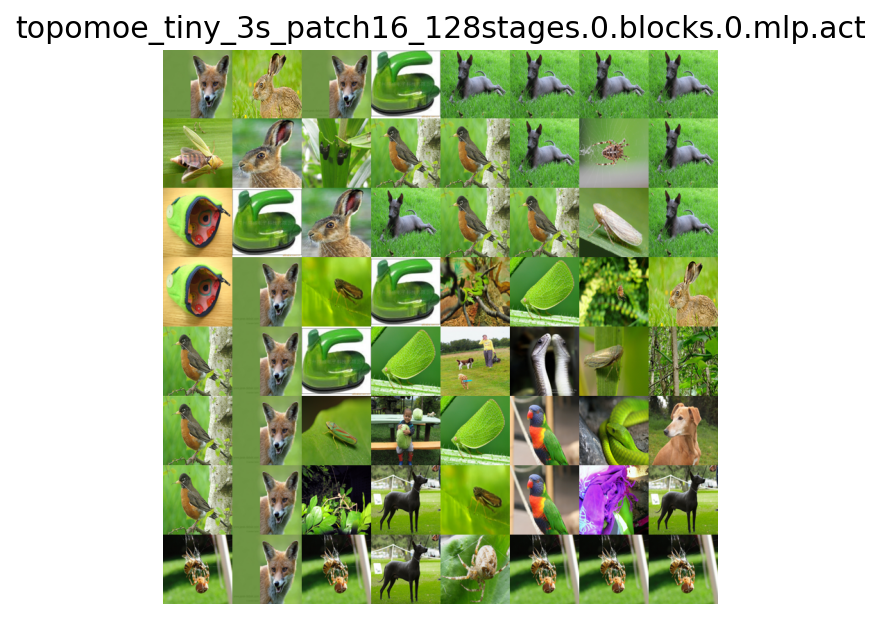

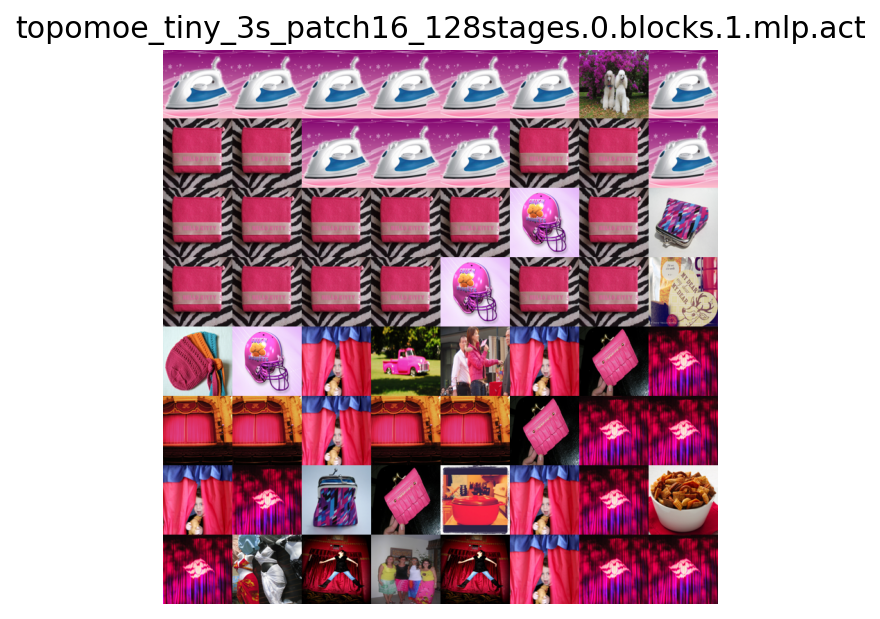

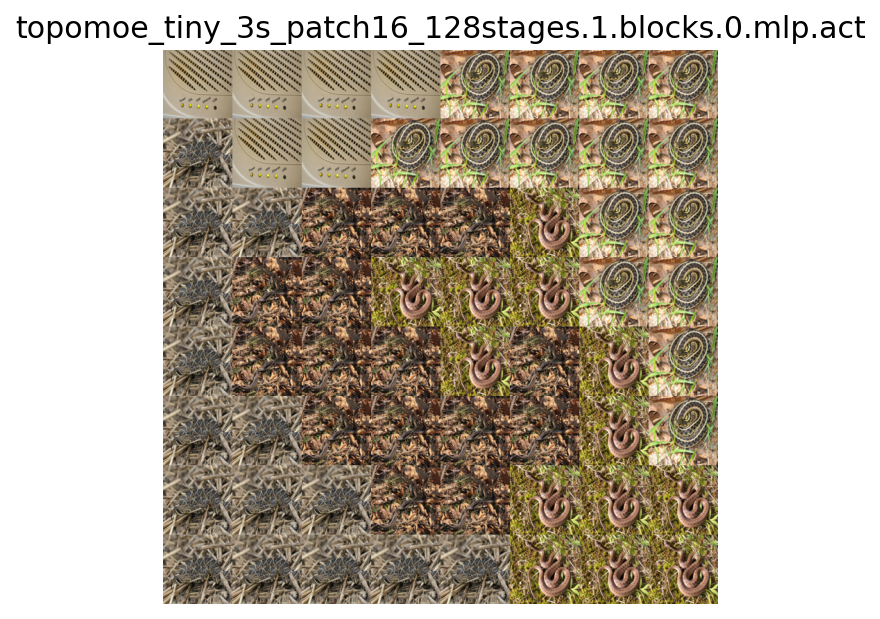

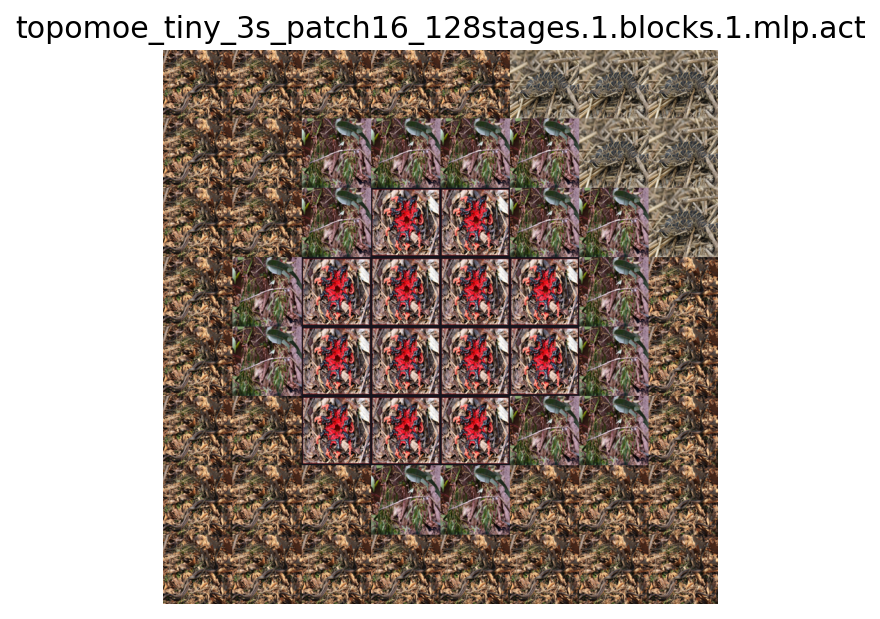

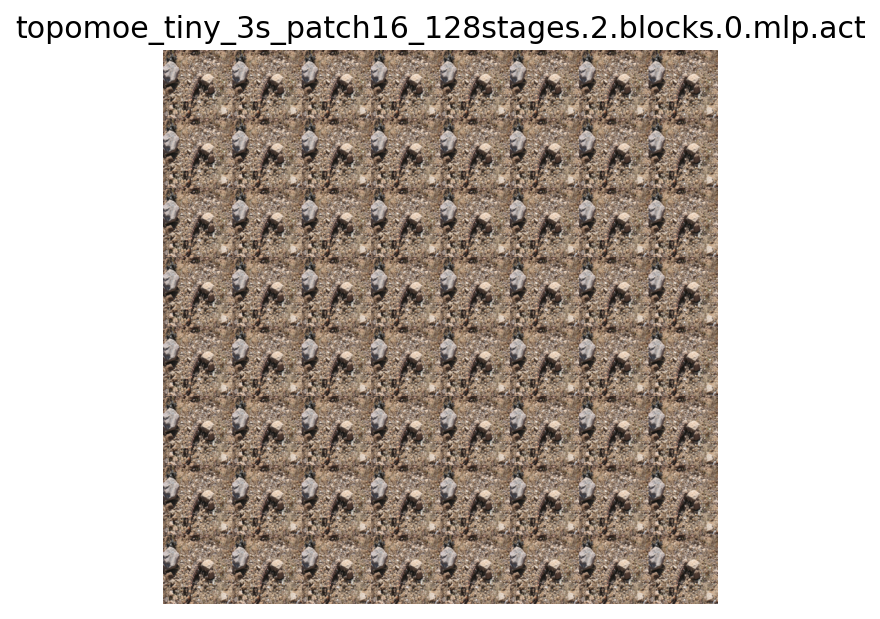

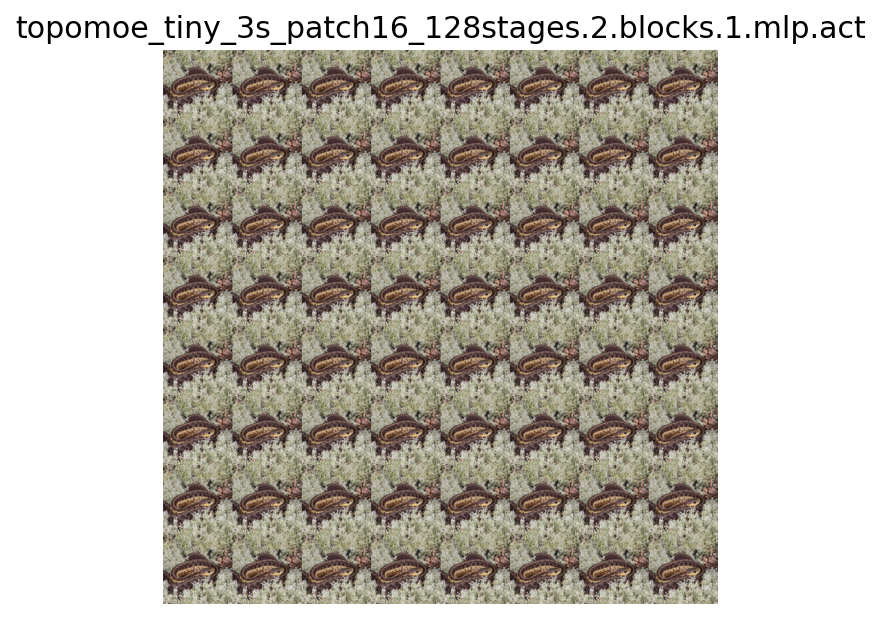

In [12]:
%matplotlib inline

visualisations = create_most_activating_image_grid(layers=layers, features_path=features_path, dataset=dataset_path, num_img=1)

for layer, img in visualisations.items():
    plt.imshow(img)
    plt.title(f"topomoe_tiny_3s_patch16_128{layer}")
    plt.axis("off")
    plt.show()

## Most activating image and saliency map for a feature
Plotting the most activating image for each randomly sampled feature together with the activations of this feature across the patches (lighter tones in saliency maps correspond to higher activations)

In [6]:
layer_to_feat_dict = {
    "stages.0.blocks.0.mlp.act": [7, 83, 546, 81, 1354],
    "stages.0.blocks.1.mlp.act": [0, 67, 356, 739, 1230],
    "stages.1.blocks.0.mlp.act": [2, 31, 100, 263, 305],
    "stages.1.blocks.1.mlp.act": [3, 54, 125, 260, 371],
    "stages.2.blocks.0.mlp.act": [1, 25, 46, 78, 93],
    "stages.2.blocks.1.mlp.act": [5, 17, 31, 57, 83],
}

res = {
    "stages.0.blocks.0.mlp.act": {},
    "stages.0.blocks.1.mlp.act": {},
    "stages.1.blocks.0.mlp.act": {},
    "stages.1.blocks.1.mlp.act": {},
    "stages.2.blocks.0.mlp.act": {},
    "stages.2.blocks.1.mlp.act": {},
}
for layer, feats in layer_to_feat_dict.items():
    for feat in feats:
        img, top_idx = get_most_activating_image_for_feature(
            layer=layer,
            feature=feat,
            features_path=features_path,
            dataset=dataset_path,
        )
        plt.imshow(img)
        plt.title(f"topomoe_tiny_3s_patch16_128_L{layer}_F{feat}_IMG{top_idx}")
        plt.axis("off")
        plt.show()
        res[layer][feat] = top_idx.item()

print(res)

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

/var/folders/nv/1_p9hp392sbbdm2g71w42pl40000gn/T/ipykernel_55997/3628121344.py:29: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

{'stages.0.blocks.0.mlp.act': {7: 4928, 83: 2502, 546: 390, 81: 2078, 1354: 474}, 'stages.0.blocks.1.mlp.act': {0: 3368, 67: 596, 356: 837, 739: 2923, 1230: 1809}, 'stages.1.blocks.0.mlp.act': {2: 4135, 31: 146, 100: 4015, 263: 2764, 305: 897}, 'stages.1.blocks.1.mlp.act': {3: 3348, 54: 3704, 125: 3769, 260: 3678, 371: 336}, 'stages.2.blocks.0.mlp.act': {1: 269, 25: 3772, 46: 1251, 78: 4104, 93: 2443}, 'stages.2.blocks.1.mlp.act': {5: 3798, 17: 3895, 31: 2988, 57: 711, 83: 2265}}


## 3D plots of activations
Plotting the top k components explaining 90% of the variance 

In [ ]:
for layer in layers:
    for img_idx in [426, 698, 1367]:
        threed_plot_activations(
            layer=layer,
            image_idx=img_idx,
            features_path=features_path,
            dataset=dataset_path,
        )
        threed_plot_activations_v2(
            layer=layer,
            image_idx=img_idx,
            features_path=features_path,
            dataset=dataset_path,
        )


Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

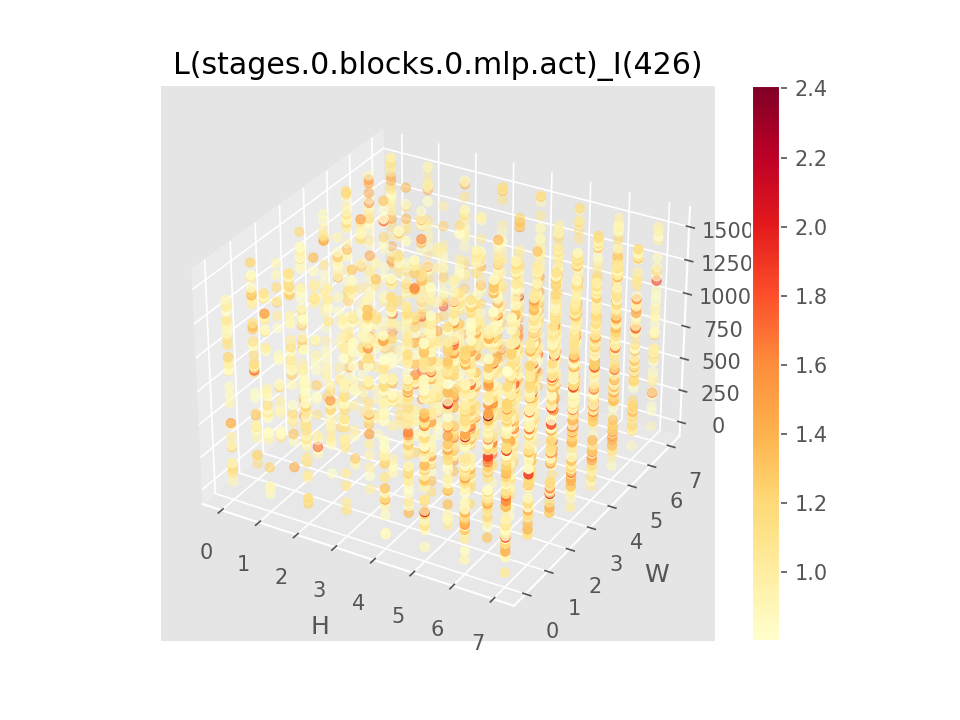

i: 0, s: 0


Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

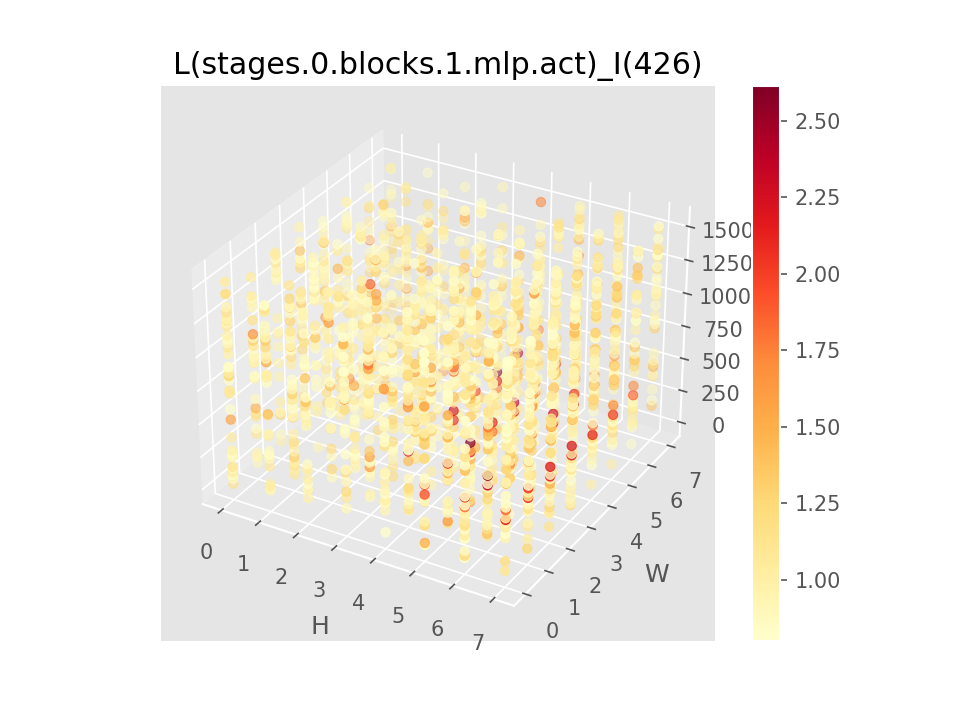

i: 1, s: 0


Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

/Users/alisa/Developer/columnformers_to_copy/topomoe/inspection/most_activating_images.py:295: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()


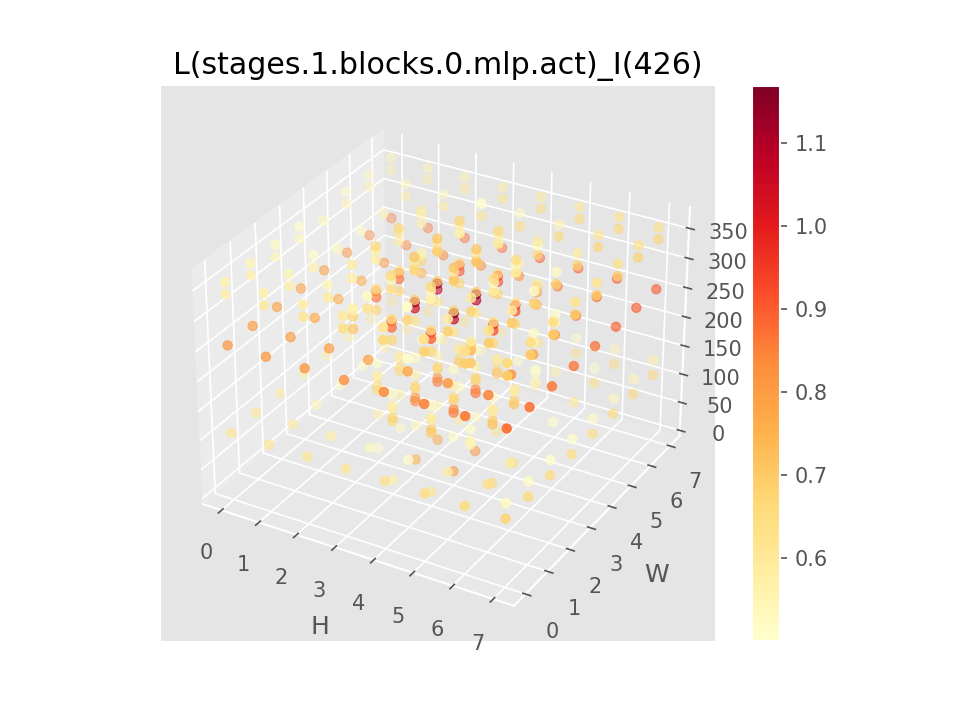

i: 2, s: 0.3


Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

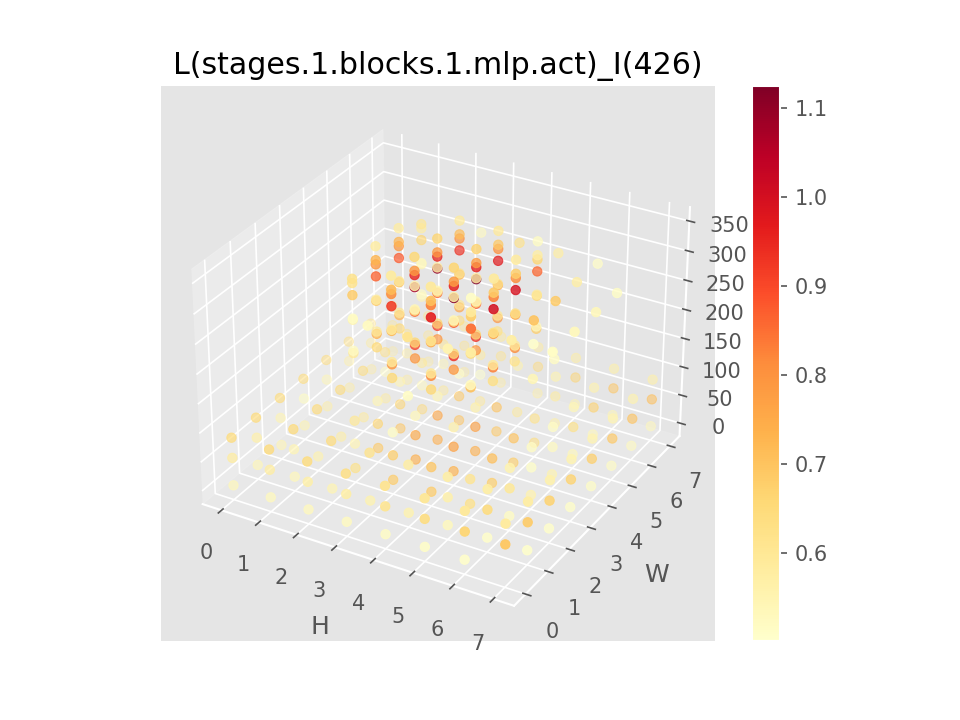

i: 3, s: 0.3


Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

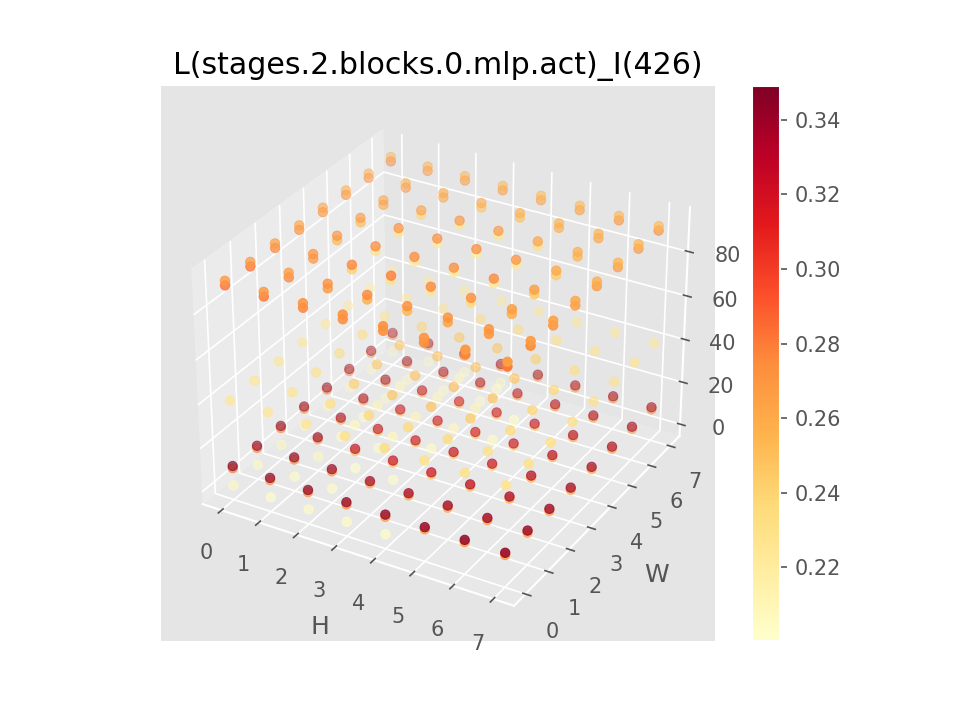

i: 4, s: 0.6


Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

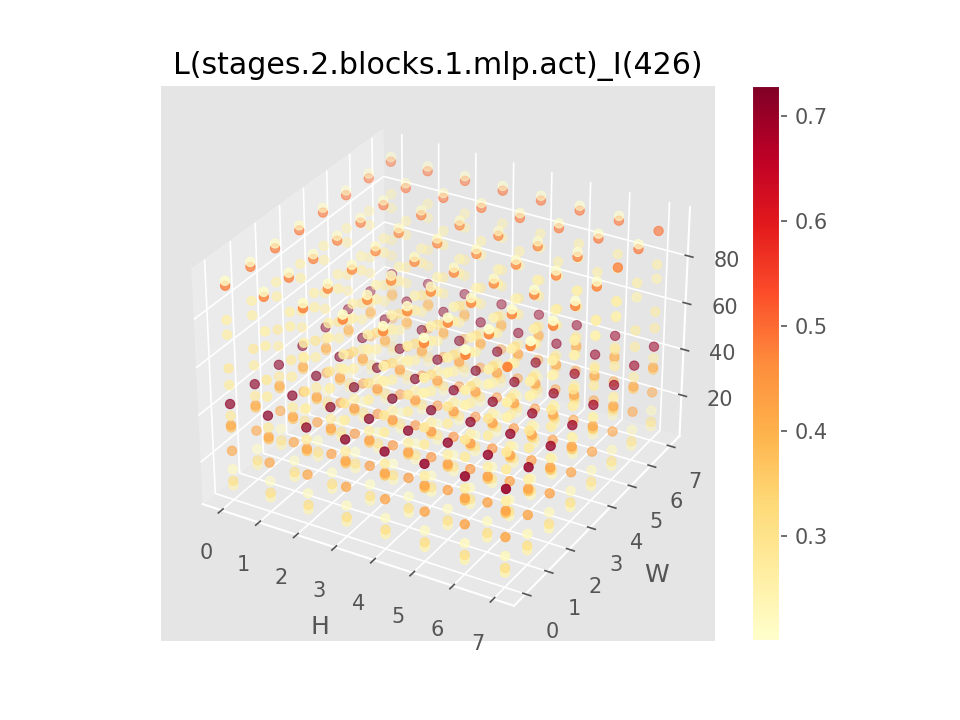

i: 5, s: 0.6


In [6]:
s = 0

for i, layer in enumerate(layers):
    threed_plot_activations_no_pca(
        layer=layer,
        image_idx=426,
        features_path=features_path,
        dataset=dataset_path,
        threshold=0.8-s
    )
    print(f"i: {i}, s: {s}")
    if i % 2 == 1:
        s += 0.3


## DINO style visualizations

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


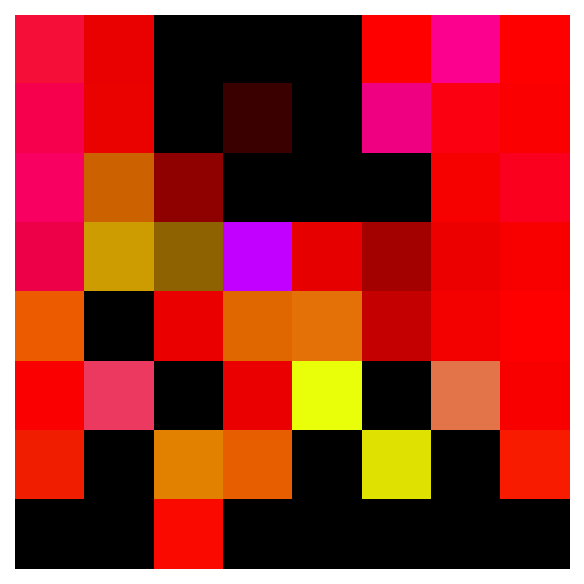

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


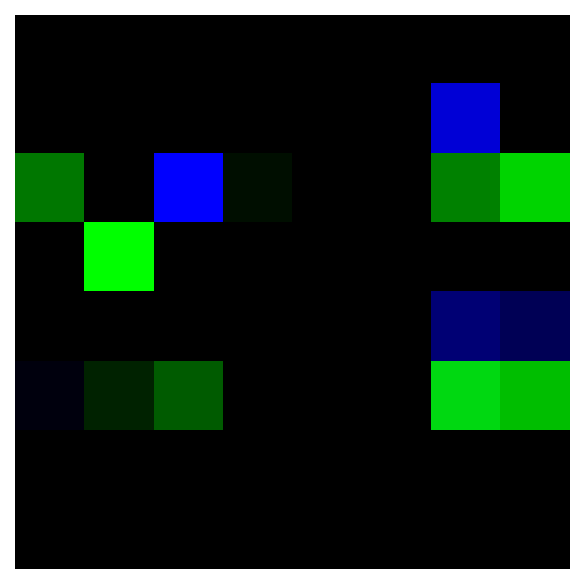

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


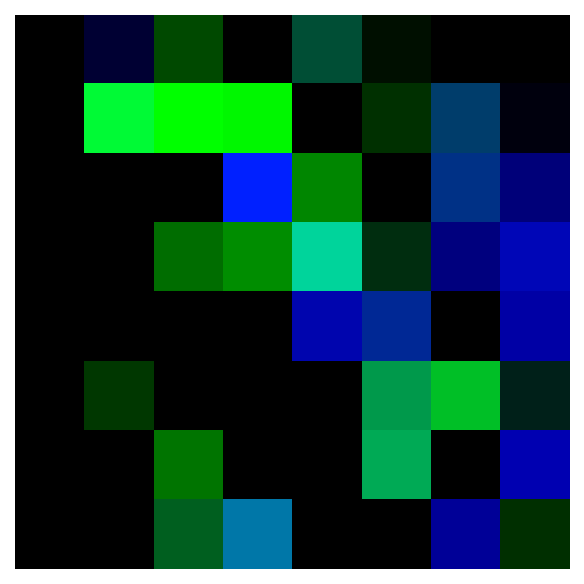

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


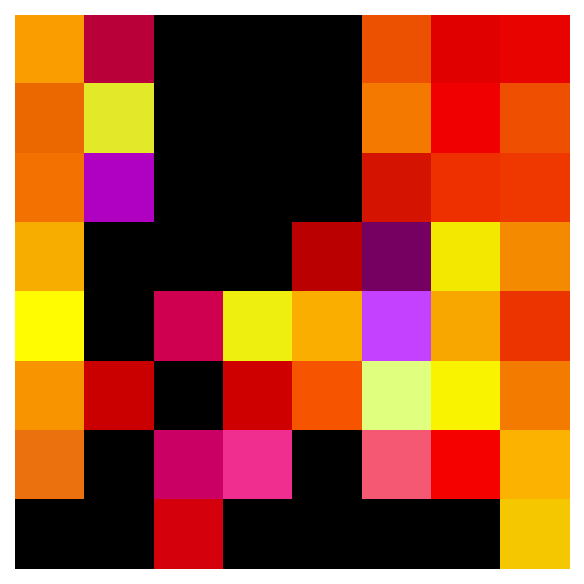

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


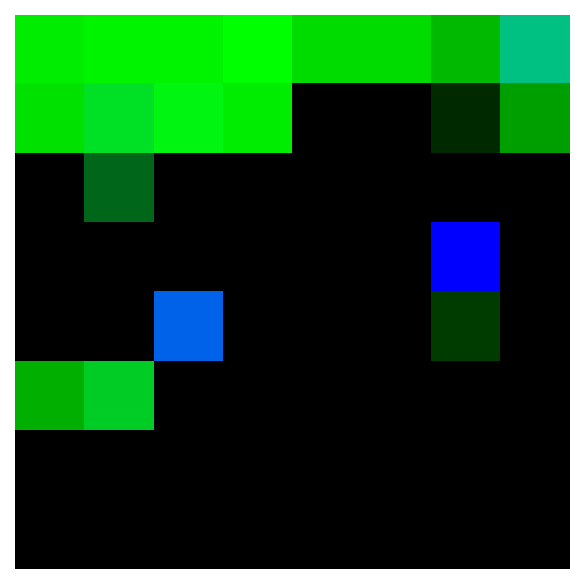

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


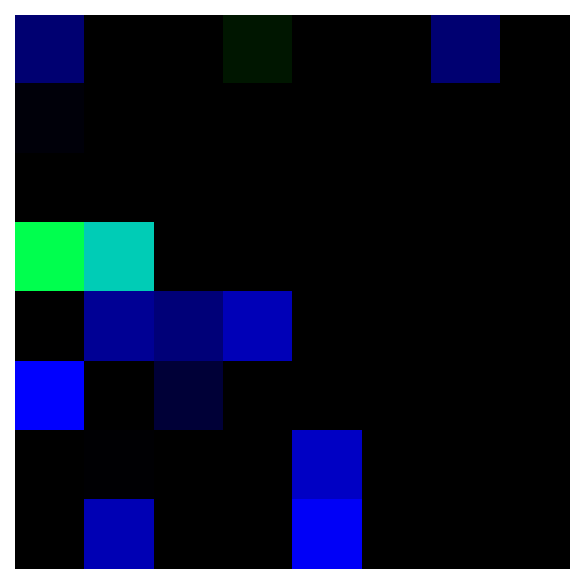

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


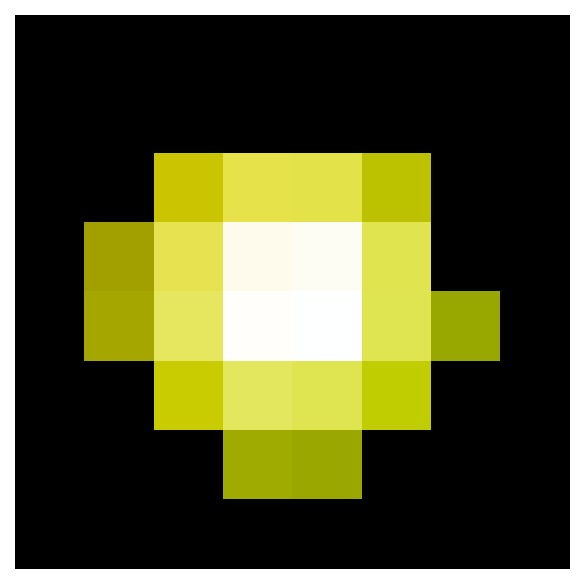

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


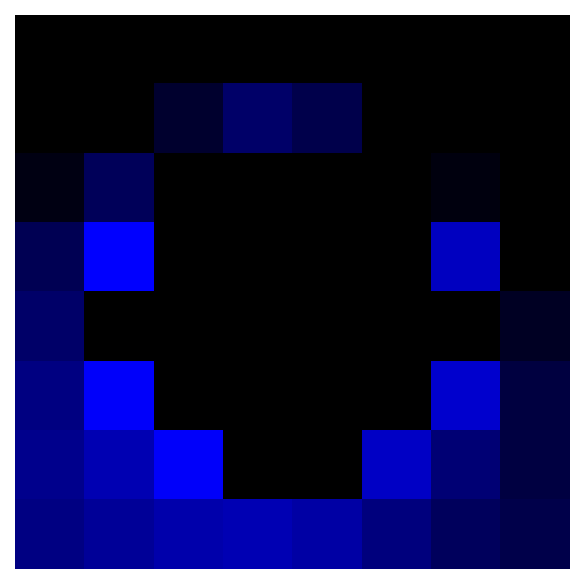

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


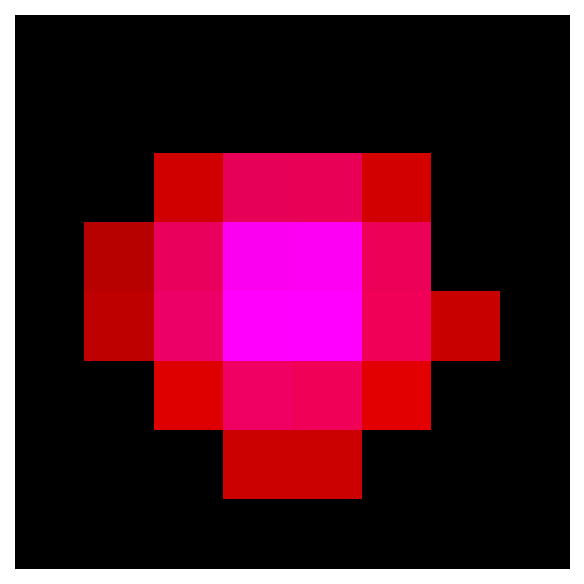

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


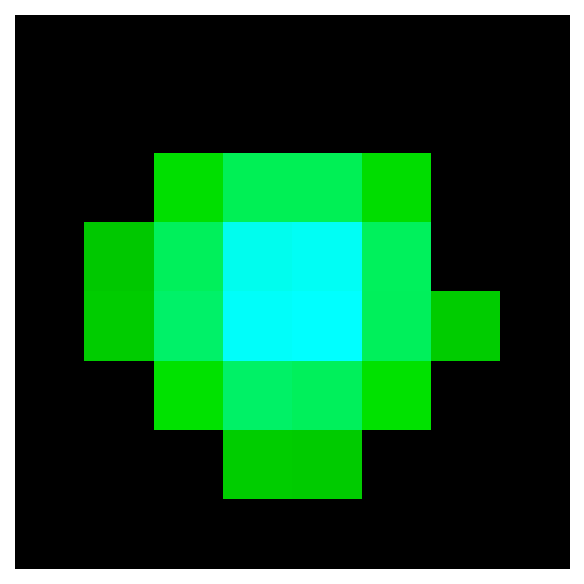

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


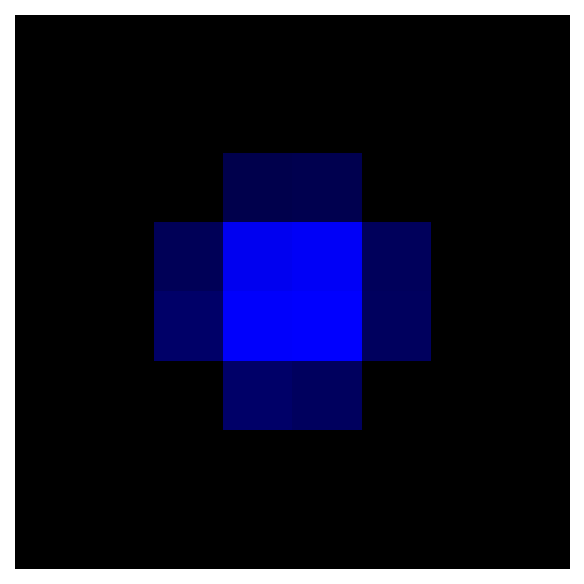

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


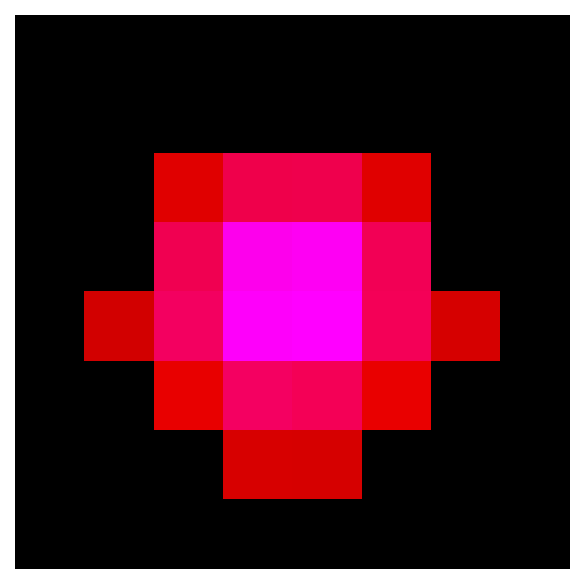

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


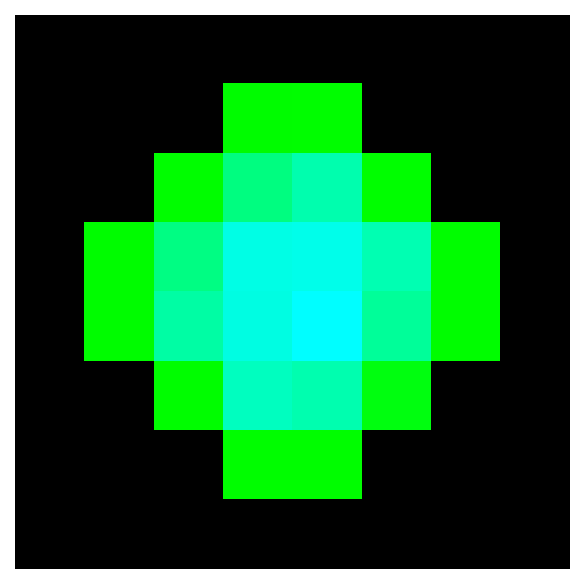

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


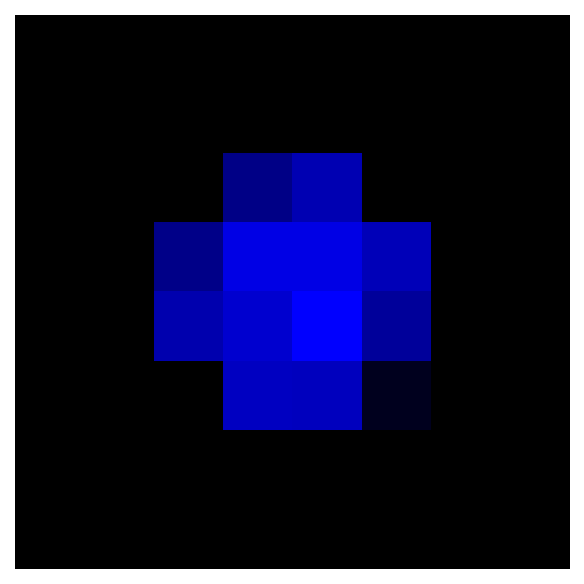

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


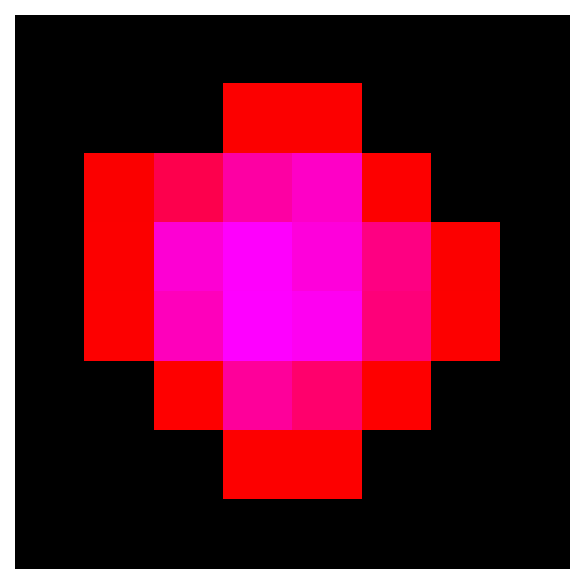

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


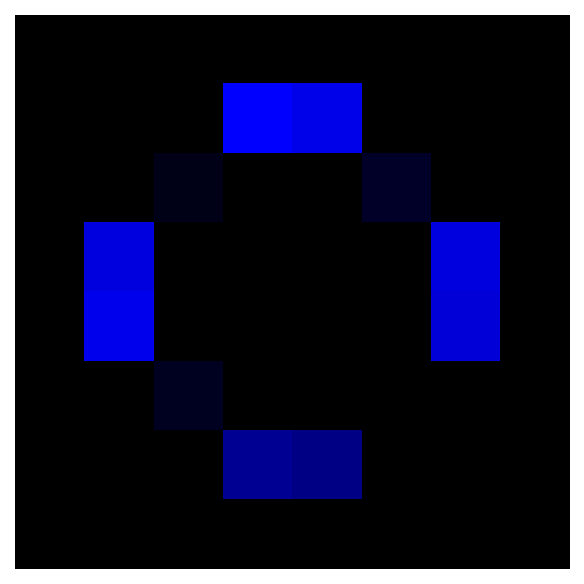

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


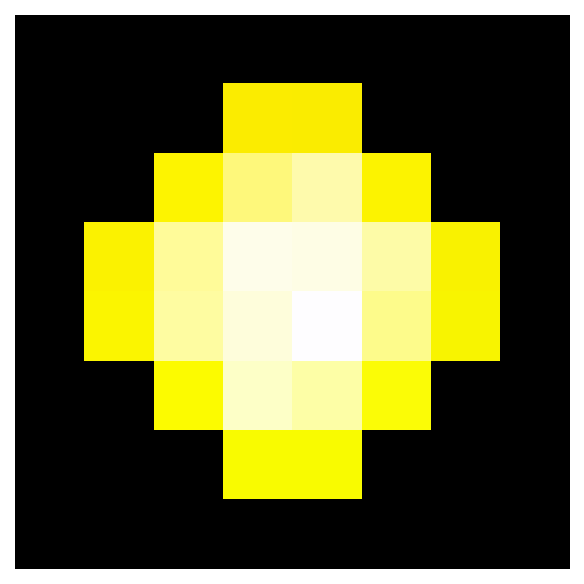

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


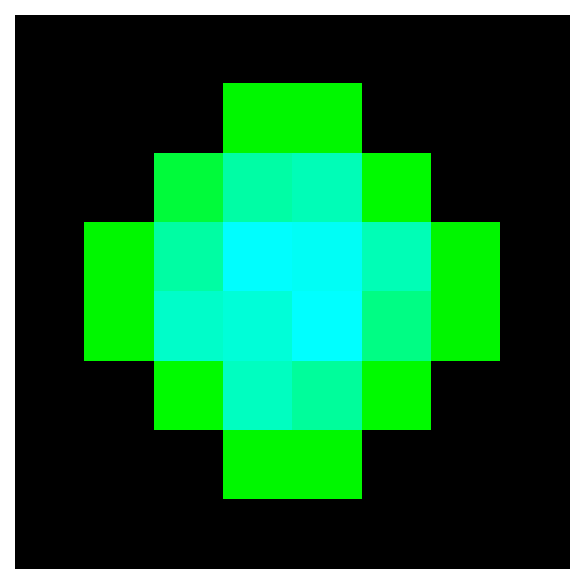

In [5]:
img_ids = [3943, 3915, 3939]
dataset = create_dataset(dataset_path, root=None, download=True)

for layer in layers:
    img = dino_rgb_viz(layer=layer, image_idx=img_ids, features_path=features_path)

    for i, img_i in enumerate(img_ids):
        # dataset[img_i][0].show()
        im = img[i]
        for i in range(im.shape[-1]):
            im[:,:,i] = im[:,:,i] / np.max(im[:,:,i]) if np.max(im[:,:,i]) > 0  else im[:,:,i]
        plt.imshow(im)
        plt.axis("off")
        plt.show()

## Moran's I
Quantifyng activation clustering

In [4]:
pca = PCA(n_components=1000)

with h5py.File(features_path, "r") as f:
    for layer in layers[2:]:
        activations = np.array(f[layer])
        if "stages.0" in layer:
            # reducing the dimension of the first stage's activations to 1000
            num_images, num_patches, embedding_dim = activations.shape
            flattened_activations = activations.reshape(num_images * num_patches, embedding_dim)
            projected_activations = torch.tensor(pca.fit_transform(flattened_activations))
            img_activations = projected_activations.reshape(num_images, num_patches, -1)
        else:
            img_activations = torch.tensor(activations)
        for i in [3, 357, 1804, 3941, 4897]:
            mi = morans_i(img_activations[i, :, :])
            print(f"Layer: {layer}, img: {i}, Moran's I: {round(mi,4)}")

Layer: stages.1.blocks.0.mlp.act, img: 3, Moran's I: 0.0263
Layer: stages.1.blocks.0.mlp.act, img: 357, Moran's I: 0.0255
Layer: stages.1.blocks.0.mlp.act, img: 1804, Moran's I: 0.0256
Layer: stages.1.blocks.0.mlp.act, img: 3941, Moran's I: 0.0268
Layer: stages.1.blocks.0.mlp.act, img: 4897, Moran's I: 0.0284
Layer: stages.1.blocks.1.mlp.act, img: 3, Moran's I: 0.0246
Layer: stages.1.blocks.1.mlp.act, img: 357, Moran's I: 0.0267
Layer: stages.1.blocks.1.mlp.act, img: 1804, Moran's I: 0.0273
Layer: stages.1.blocks.1.mlp.act, img: 3941, Moran's I: 0.026
Layer: stages.1.blocks.1.mlp.act, img: 4897, Moran's I: 0.0252
Layer: stages.2.blocks.0.mlp.act, img: 3, Moran's I: 0.0281
Layer: stages.2.blocks.0.mlp.act, img: 357, Moran's I: 0.0264
Layer: stages.2.blocks.0.mlp.act, img: 1804, Moran's I: 0.0293
Layer: stages.2.blocks.0.mlp.act, img: 3941, Moran's I: 0.0237
Layer: stages.2.blocks.0.mlp.act, img: 4897, Moran's I: 0.0246
Layer: stages.2.blocks.1.mlp.act, img: 3, Moran's I: 0.0264
Layer: s

In [5]:
# calculating average Moran's I values for the final layer

morans_i_layer = []

with h5py.File(features_path, "r") as f:
    activations = torch.tensor(np.array(f[layers[-1]]))
    for i in tqdm(range(5000)):
        morans_i_layer.append(morans_i(activations[i]))

print(sum(morans_i_layer) / len(morans_i_layer))
print(statistics.stdev(morans_i_layer))

100%|██████████| 5000/5000 [27:32<00:00,  3.03it/s]  

0.02910159870213099
0.0038339799924873522


## RMSE, SSIM and general activation statistics

In [11]:
imgs = {
    "78_meerkat": [
    3900,
    3901,
    3902,
    3903,
    3904,
    3905,
    3906,
    3907,
    3908,
    3909,
    3910,
    3911,
    3912,
    3913,
    3914,
    3915,
    3916,
    3917,
    3918,
    3919,
    3920,
    3921,
    3922,
    3923,
    3924,
    3925,
    3926,
    3927,
    3928,
    3929,
    3930,
    3931,
    3932,
    3933,
    3934,
    3935,
    3936,
    3937,
    3938,
    3939,
    3940,
    3941,
    3942,
    3943,
    3944,
    3945,
    3946,
    3947,
    3948,
    3949,
],
    "61_safety_pin": [
    3050,
    3051,
    3052,
    3053,
    3054,
    3055,
    3056,
    3057,
    3058,
    3059,
    3060,
    3061,
    3062,
    3063,
    3064,
    3065,
    3066,
    3067,
    3068,
    3069,
    3070,
    3071,
    3072,
    3073,
    3074,
    3075,
    3076,
    3077,
    3078,
    3079,
    3080,
    3081,
    3082,
    3083,
    3084,
    3085,
    3086,
    3087,
    3088,
    3089,
    3090,
    3091,
    3092,
    3093,
    3094,
    3095,
    3096,
    3097,
    3098,
    3099,
],
    "56_fiddler_crab": [
    2800,
    2801,
    2802,
    2803,
    2804,
    2805,
    2806,
    2807,
    2808,
    2809,
    2810,
    2811,
    2812,
    2813,
    2814,
    2815,
    2816,
    2817,
    2818,
    2819,
    2820,
    2821,
    2822,
    2823,
    2824,
    2825,
    2826,
    2827,
    2828,
    2829,
    2830,
    2831,
    2832,
    2833,
    2834,
    2835,
    2836,
    2837,
    2838,
    2839,
    2840,
    2841,
    2842,
    2843,
    2844,
    2845,
    2846,
    2847,
    2848,
    2849,
],
    "40_moped": [
    2000,
    2001,
    2002,
    2003,
    2004,
    2005,
    2006,
    2007,
    2008,
    2009,
    2010,
    2011,
    2012,
    2013,
    2014,
    2015,
    2016,
    2017,
    2018,
    2019,
    2020,
    2021,
    2022,
    2023,
    2024,
    2025,
    2026,
    2027,
    2028,
    2029,
    2030,
    2031,
    2032,
    2033,
    2034,
    2035,
    2036,
    2037,
    2038,
    2039,
    2040,
    2041,
    2042,
    2043,
    2044,
    2045,
    2046,
    2047,
    2048,
    2049,
],
    "12_pineapple": [
    600,
    601,
    602,
    603,
    604,
    605,
    606,
    607,
    608,
    609,
    610,
    611,
    612,
    613,
    614,
    615,
    616,
    617,
    618,
    619,
    620,
    621,
    622,
    623,
    624,
    625,
    626,
    627,
    628,
    629,
    630,
    631,
    632,
    633,
    634,
    635,
    636,
    637,
    638,
    639,
    640,
    641,
    642,
    643,
    644,
    645,
    646,
    647,
    648,
    649,
],
}

print(f"{'Class':<20} {'Layer':<30} {'Mean RMSE':<10} {'Std RMSE':<10}")

for class_label, img_list in imgs.items():
    for layer in layers:
        with h5py.File(features_path, "r") as f:
            activations = torch.tensor(np.array(f[layer]))
            differences = []
            for i in range(len(img_list)):
                for j in range(i + 1, len(img_list)):
                    differences.append(
                        activation_difference(
                            activations[img_list[i], :, :],
                            activations[img_list[j], :, :],
                        )
                    )
            mean = round(sum(differences) / len(differences), 4)
            std = round(statistics.stdev(differences), 4)
            print(f"{class_label:<20} {layer:<30} {mean:<10} {std:<10}")

Class                Layer                          Mean RMSE  Std RMSE  
78_meerkat           stages.0.blocks.0.mlp.act      0.3688     0.019     
78_meerkat           stages.0.blocks.1.mlp.act      0.35       0.0173    
78_meerkat           stages.1.blocks.0.mlp.act      0.1977     0.0485    
78_meerkat           stages.1.blocks.1.mlp.act      0.1849     0.0418    
78_meerkat           stages.2.blocks.0.mlp.act      0.1496     0.0491    
78_meerkat           stages.2.blocks.1.mlp.act      0.1614     0.051     
61_safety_pin        stages.0.blocks.0.mlp.act      0.3657     0.0279    
61_safety_pin        stages.0.blocks.1.mlp.act      0.3512     0.0275    
61_safety_pin        stages.1.blocks.0.mlp.act      0.2102     0.0577    
61_safety_pin        stages.1.blocks.1.mlp.act      0.2031     0.0447    
61_safety_pin        stages.2.blocks.0.mlp.act      0.1463     0.0355    
61_safety_pin        stages.2.blocks.1.mlp.act      0.1828     0.0439    
56_fiddler_crab      stages.0.blocks.0

In [15]:
print(f"{'Class':<20} {'Layer':<30} {'Mean activation':<17} {'Max activation':<17} {'Min activation':<17} {'Std activation':<17}")

for img_s, img_l in imgs.items():
    with h5py.File(features_path, "r") as f:
        activations = torch.tensor(np.array(f[layer]))
        for layer in layers:
            img_acts = activations[img_l, :, :]
            img_acts_flat = img_acts.flatten().tolist()
            mean = round(torch.mean(img_acts).item(), 4)
            max = round(torch.max(img_acts).item(), 4)
            min = round(torch.min(img_acts).item(), 4)
            std = round(statistics.stdev(img_acts_flat), 4)
            print(f"{img_s:<20} {layer:<30} {mean:<17} {max:<17} {min:<17} {std:<17}")

Class                Layer                          Mean activation   Max activation    Min activation    Std activation   
78_meerkat           stages.0.blocks.0.mlp.act      0.064             2.8438            -0.17             0.2568           
78_meerkat           stages.0.blocks.1.mlp.act      0.064             2.8438            -0.17             0.2568           
78_meerkat           stages.1.blocks.0.mlp.act      0.064             2.8438            -0.17             0.2568           
78_meerkat           stages.1.blocks.1.mlp.act      0.064             2.8438            -0.17             0.2568           
78_meerkat           stages.2.blocks.0.mlp.act      0.064             2.8438            -0.17             0.2568           
78_meerkat           stages.2.blocks.1.mlp.act      0.064             2.8438            -0.17             0.2568           
61_safety_pin        stages.0.blocks.0.mlp.act      0.0335            1.6124            -0.17             0.1405           
61_safet

In [16]:
print(f"{'Class':<20} {'Layer':<30} {'Mean SSIM':<10} {'Std SSIM':<10}")

for class_label, img_list in imgs.items():
    for layer in layers:
        with h5py.File(features_path, "r") as f:
            activations = torch.tensor(np.array(f[layer]))
            differences = []
            for i in range(len(img_list)):
                for j in range(i + 1, len(img_list)):
                    res = activation_structural_similarity(
                    activations[img_list[i], :, :],
                    activations[img_list[j], :, :],
                )
                    if res is not None:
                        differences.append(float(res))
            mean = round(sum(differences) / len(differences), 4)
            std = round(statistics.stdev(differences), 4)
            print(f"{class_label:<20} {layer:<30} {mean:<10} {std:<10}")

Class                Layer                          Mean SSIM  Std SSIM  
78_meerkat           stages.0.blocks.0.mlp.act      0.0403     0.0324    
78_meerkat           stages.0.blocks.1.mlp.act      0.0368     0.0279    
78_meerkat           stages.1.blocks.0.mlp.act      0.1676     0.1169    
78_meerkat           stages.1.blocks.1.mlp.act      0.1539     0.1211    
78_meerkat           stages.2.blocks.0.mlp.act      0.1623     0.2127    
78_meerkat           stages.2.blocks.1.mlp.act      0.1569     0.2103    
61_safety_pin        stages.0.blocks.0.mlp.act      0.0289     0.0286    
61_safety_pin        stages.0.blocks.1.mlp.act      0.0298     0.0264    
61_safety_pin        stages.1.blocks.0.mlp.act      0.1528     0.1505    
61_safety_pin        stages.1.blocks.1.mlp.act      0.1187     0.1178    
61_safety_pin        stages.2.blocks.0.mlp.act      0.0908     0.173     
61_safety_pin        stages.2.blocks.1.mlp.act      0.076      0.1944    
56_fiddler_crab      stages.0.blocks.0

In [22]:
# calculating RMSE for random image pairs

print(f"{'Layer':<30} {'Mean RMSE':<10} {'Std RMSE':<10}")

with h5py.File(features_path, "r") as f:
    for layer in layers:
        activations = torch.tensor(np.array(f[layer]))
        differences = []
        for _ in range(1000):
            differences.append(
                activation_difference(
                    activations[random.randint(0, activations.shape[0] - 1), :, :],
                    activations[random.randint(0, activations.shape[0] - 1), :, :],
                )
            )
        mean = round(sum(differences) / len(differences), 4)
        std = round(statistics.stdev(differences), 4)
        print(f"{layer:<30} {mean:<10} {std:<10}")

Layer                          Mean RMSE  Std RMSE  
stages.0.blocks.0.mlp.act      0.3725     0.0222    
stages.0.blocks.1.mlp.act      0.3612     0.0225    
stages.1.blocks.0.mlp.act      0.2334     0.0571    
stages.1.blocks.1.mlp.act      0.2224     0.0453    
stages.2.blocks.0.mlp.act      0.1664     0.0479    
stages.2.blocks.1.mlp.act      0.196      0.052     


In [26]:
# calculating SSIM for random image pairs

print(f"{'Layer':<30} {'Mean SSIM':<10} {'Std SSIM':<10}")

with h5py.File(features_path, "r") as f:
    for layer in layers:
        activations = torch.tensor(np.array(f[layer]))
        differences = []
        for _ in range(300):
            res = activation_structural_similarity(
                    activations[random.randint(0, activations.shape[0] - 1), :, :],
                    activations[random.randint(0, activations.shape[0] - 1), :, :],
                )
            if res is not None:
                differences.append(float(res))
        mean = round(sum(differences) / len(differences), 4)
        std = round(statistics.stdev(differences), 4)
        print(f"{layer:<30} {mean:<10} {std:<10}")

Layer                          Mean SSIM  Std SSIM  
stages.0.blocks.0.mlp.act      0.0343     0.0308    
stages.0.blocks.1.mlp.act      0.0299     0.0258    
stages.1.blocks.0.mlp.act      0.1077     0.1215    
stages.1.blocks.1.mlp.act      0.0916     0.1151    
stages.2.blocks.0.mlp.act      0.0538     0.1969    
stages.2.blocks.1.mlp.act      0.0357     0.203     


## Plotting top activated features for an image

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

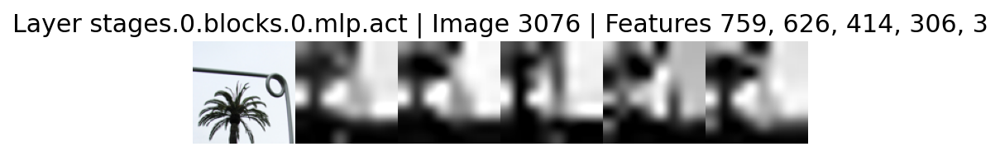

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

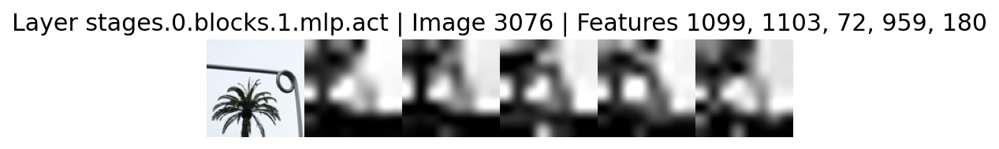

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

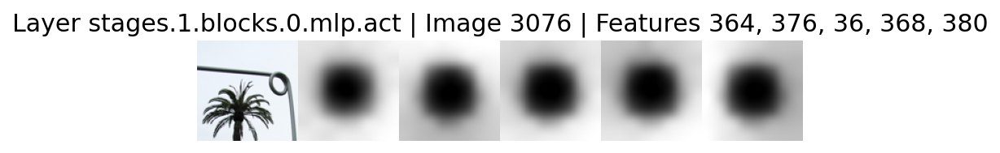

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

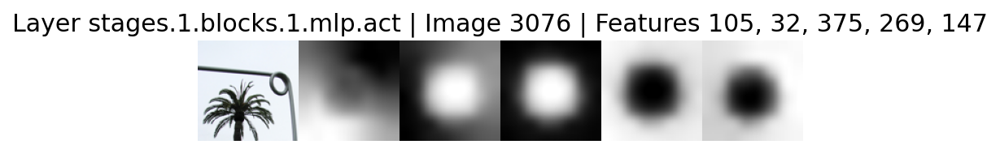

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

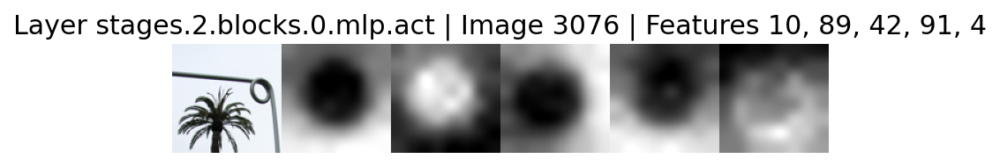

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

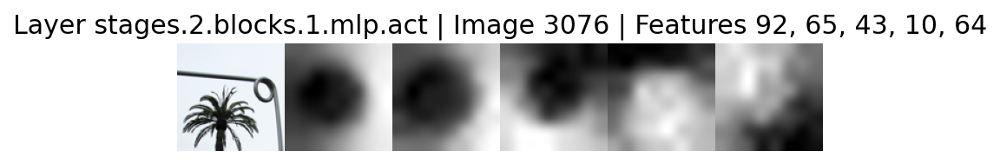

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

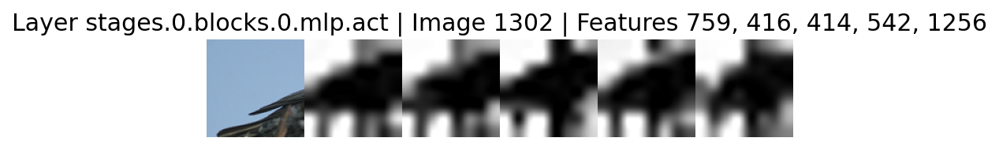

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

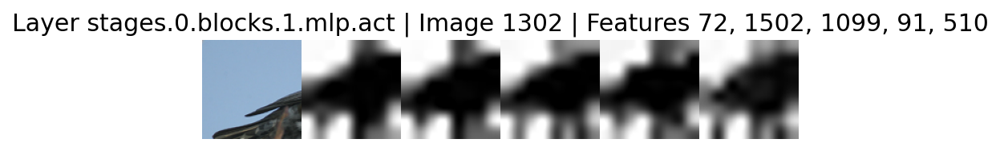

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

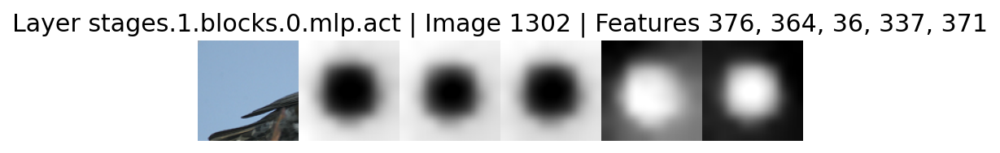

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

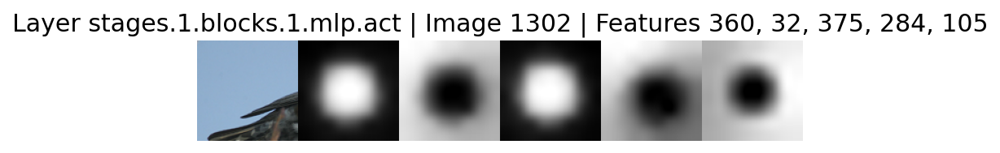

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

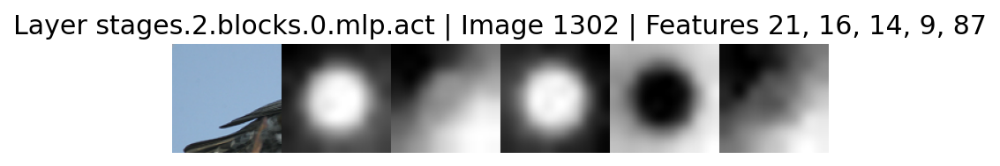

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

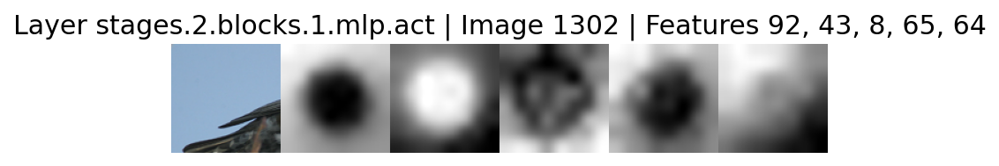

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

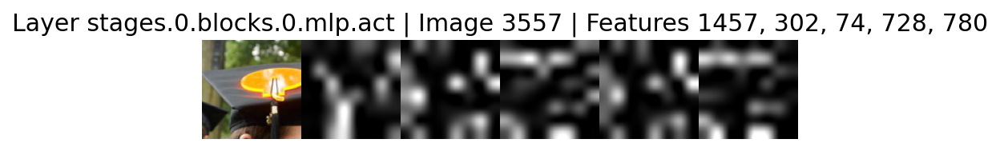

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

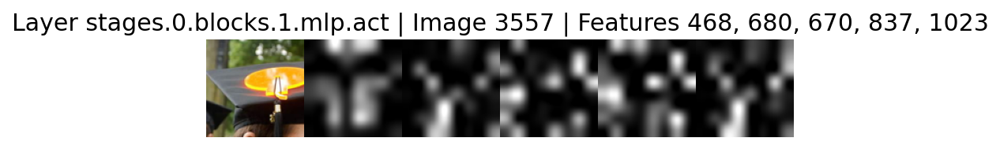

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

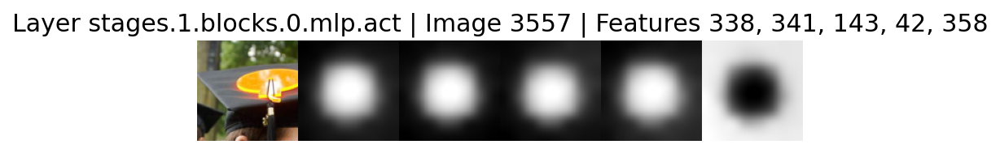

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

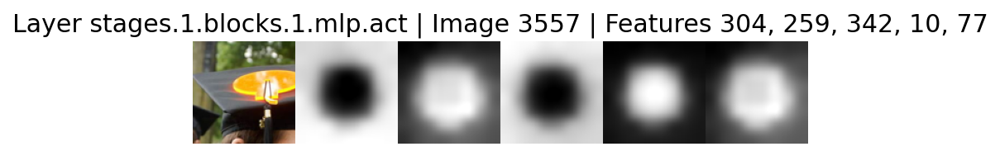

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

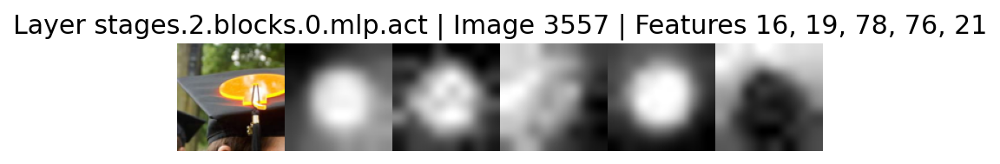

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

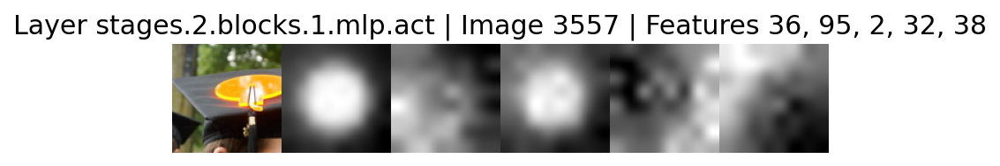

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

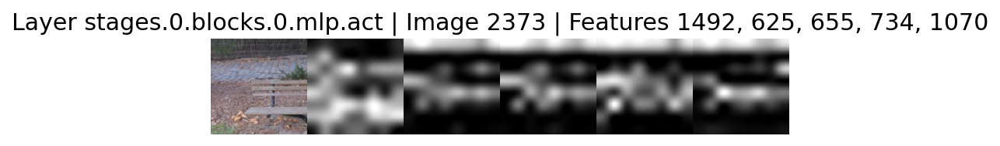

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

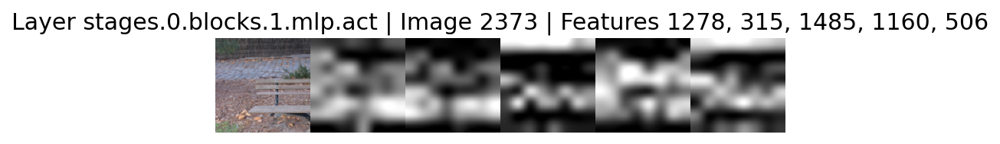

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

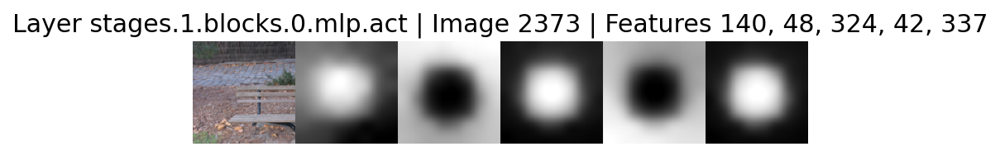

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

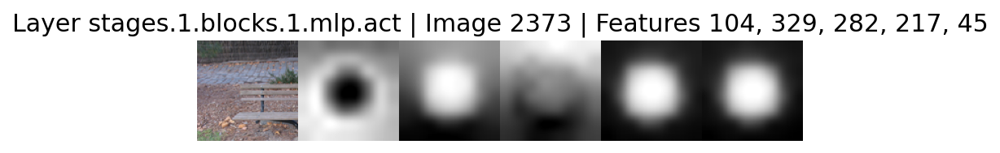

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

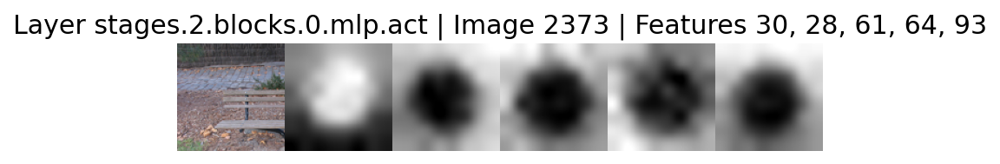

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

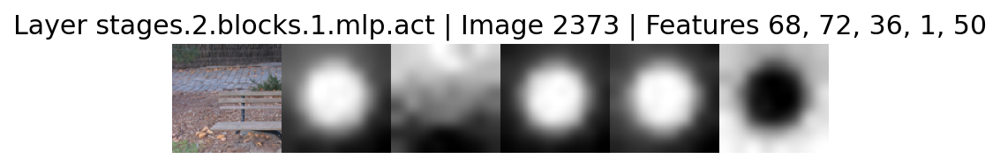

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

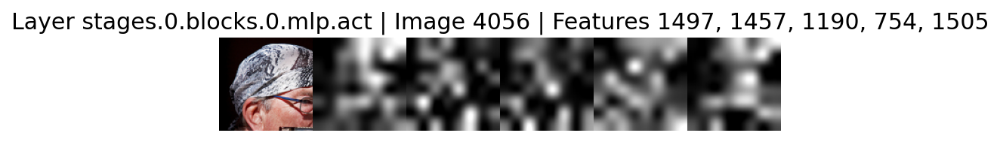

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

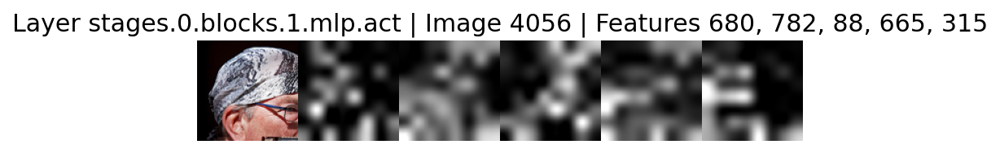

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

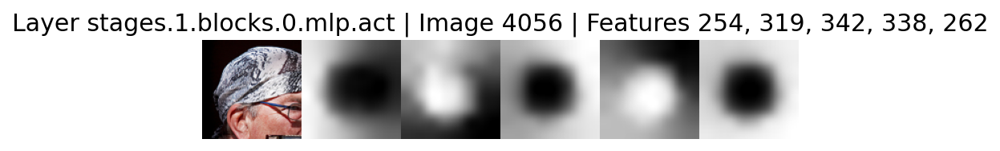

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

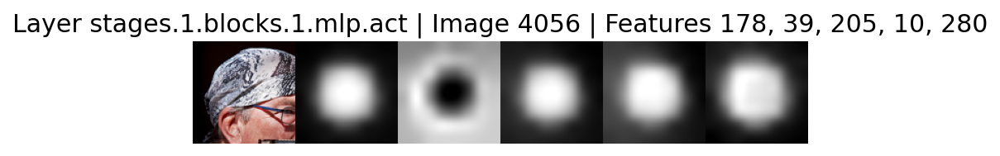

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

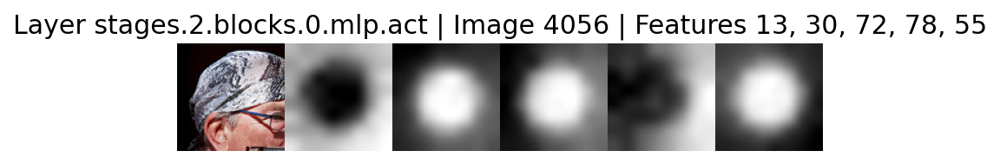

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

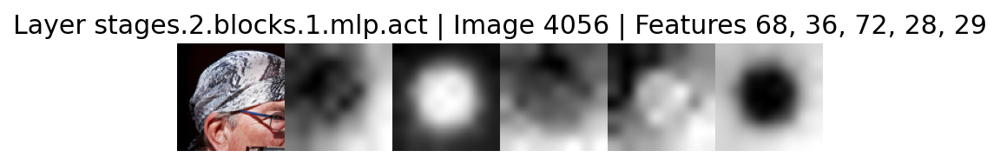

In [6]:
img_list = [3076, 1302, 3557, 2373, 4056]

# for _ in range(5):
#     img_idx = random.randint(0, 5000)
#     for layer in layers:
#         img, feats = plot_top_activated_features(
#             img_idx=img_idx,
#             layer=layer,
#             num_features=5,
#             features_path=features_path,
#             dataset=dataset_path,
#         )

#         str_feats = ", ".join([str(f) for f in feats])

#         plt.imshow(img)
#         plt.title(f"Layer {layer} | Image {img_idx} | Features {str_feats}")
#         plt.axis("off")
#         plt.show()

for img_idx in img_list:
    for layer in layers:
        img, feats = plot_top_activated_features(
            img_idx=img_idx,
            layer=layer,
            num_features=5,
            features_path=features_path,
            dataset=dataset_path,
        )

        str_feats = ", ".join([str(f) for f in feats])

        plt.imshow(img)
        plt.title(f"Layer {layer} | Image {img_idx} | Features {str_feats}")
        plt.axis("off")
        plt.show()

******* stages.0.blocks.0.mlp.act


Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

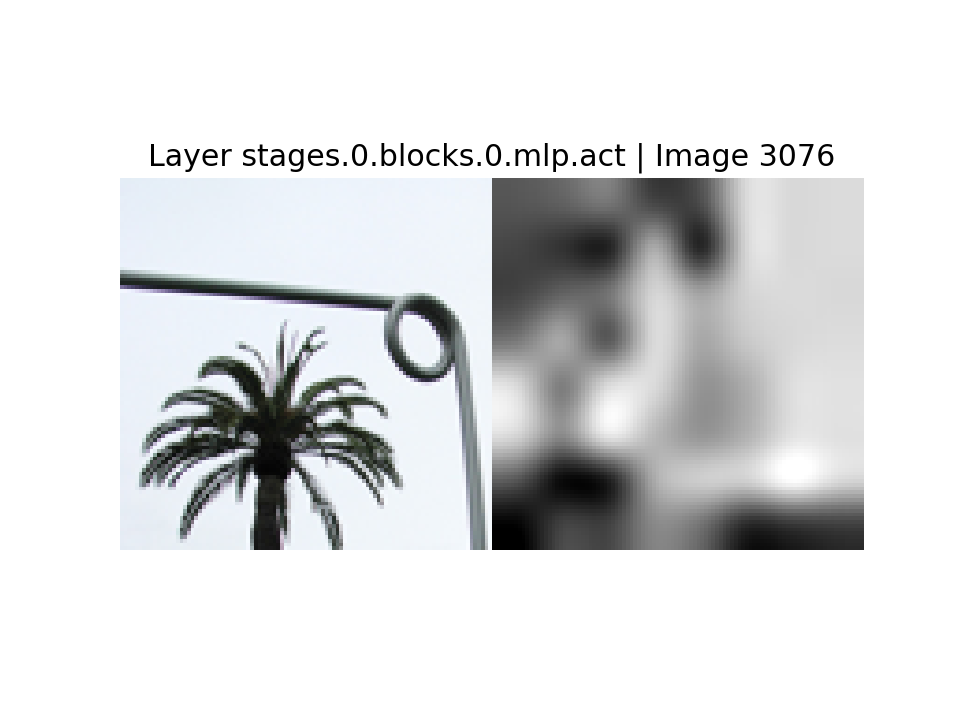

******* stages.0.blocks.1.mlp.act


Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

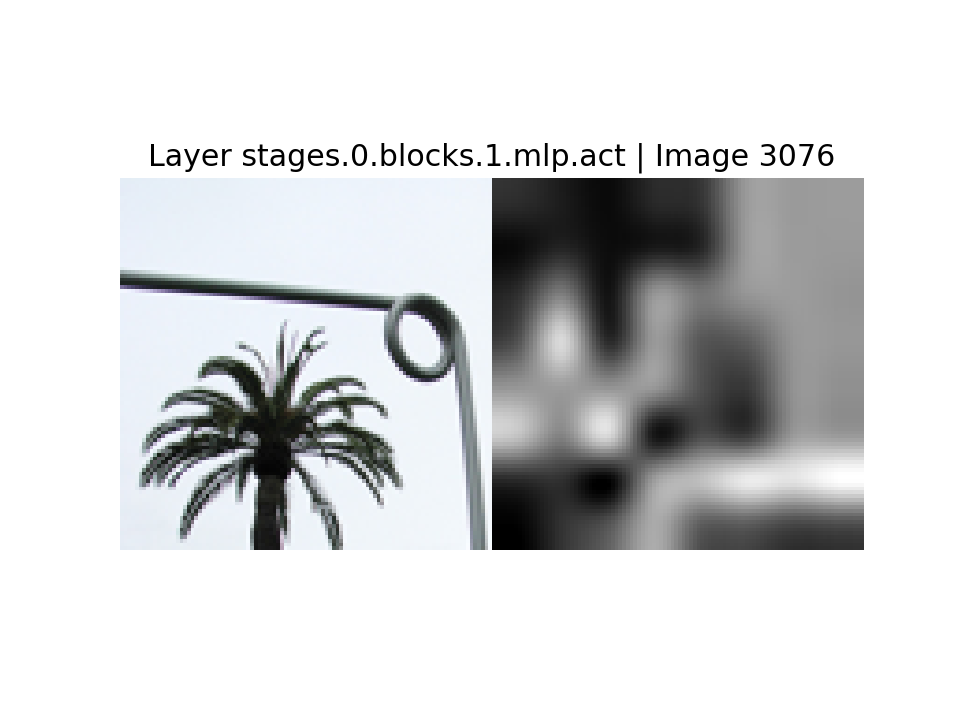

******* stages.1.blocks.0.mlp.act


Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

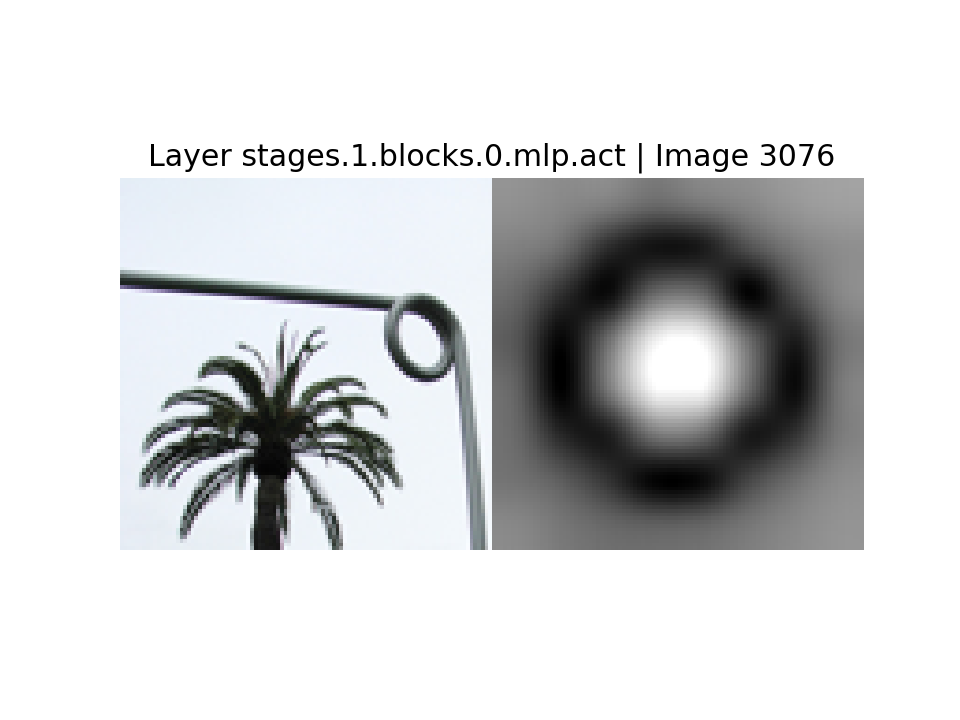

******* stages.1.blocks.1.mlp.act


Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

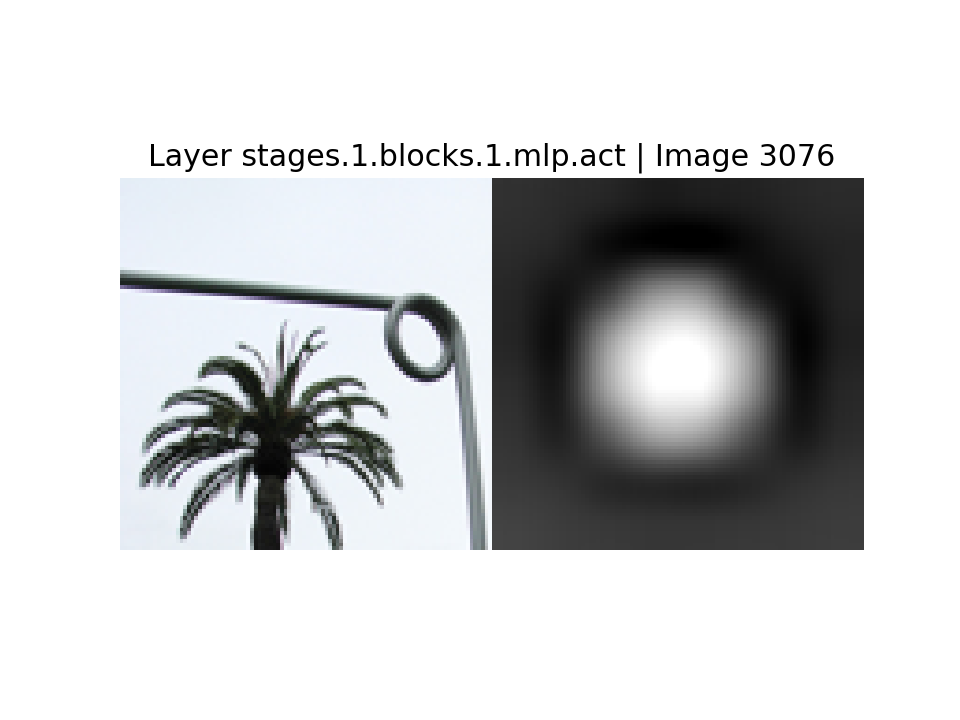

******* stages.2.blocks.0.mlp.act


Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

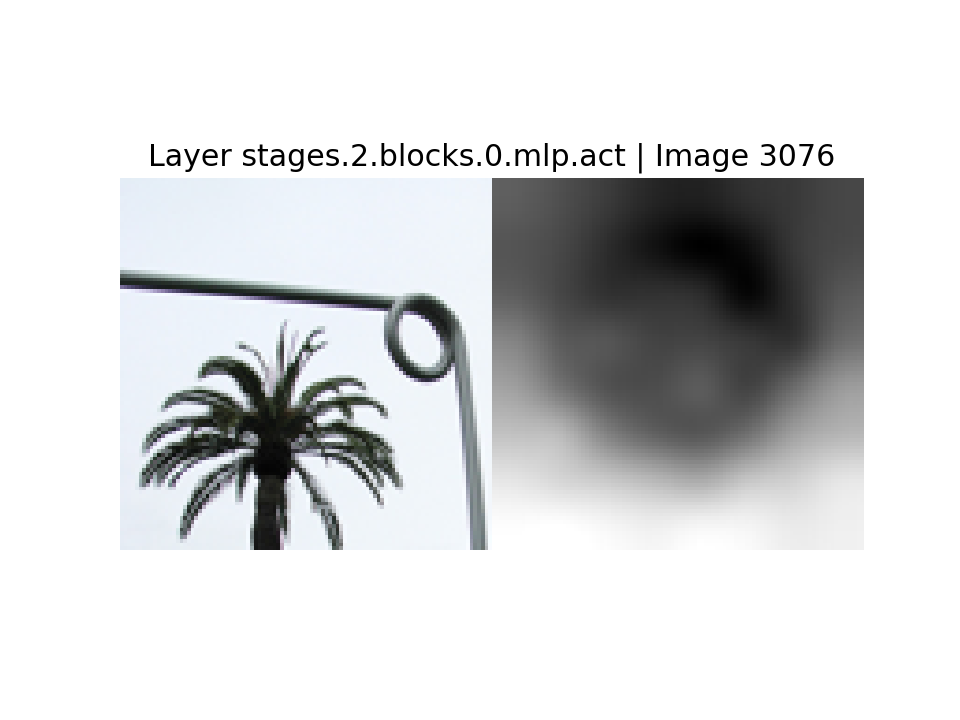

******* stages.2.blocks.1.mlp.act


Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/17 [00:00<?, ?it/s]

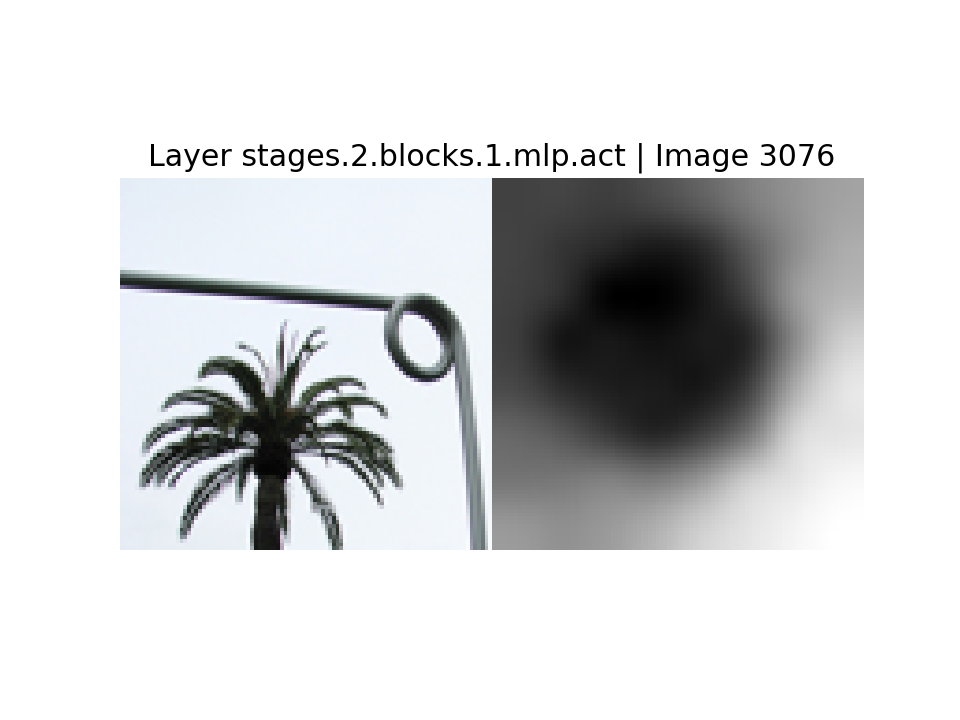

In [11]:
from PIL import Image

def plot_top_activated_patches2(
    img_idx: int,
    layer: str,
    features_path: str,
    dataset: str,
    img_size: int = 100,
):
    print("*******", layer)

    dataset = create_dataset(dataset, root=None, download=True)

    with h5py.File(features_path, "r") as f:
        activations = torch.tensor(np.array(f[layer]))[
            img_idx, :, :
        ]  # num_patches x embedding_dim
        patch_acts = torch.linalg.vector_norm(activations, ord=2, dim=1)  # num_patches

        dim = int(activations.shape[0] ** 0.5)

        images = [dataset[img_idx][0]]

        patch_acts = patch_acts.view(dim, dim).detach().numpy()

        # Normalise the activation values to [0, 255]
        act_min = patch_acts.min()
        act_max = patch_acts.max()
        normalized_act = 255 * (patch_acts - act_min) / (act_max - act_min)

        saliency_img = Image.fromarray(normalized_act.astype(np.uint8)).convert("L")
        images.append(saliency_img.resize((img_size, img_size)))

        grid_img = Image.new("RGB", (2 * img_size, img_size))

        for idx, img in enumerate(images):
            x_offset = idx * img_size
            grid_img.paste(img.convert("RGB"), (x_offset, 0))

        return grid_img
    
# img_list = [3076, 1302, 3557, 2373, 4056]
img_list = [3076]

for img_idx in img_list:
    for layer in layers:
        img = plot_top_activated_patches2(
            img_idx=img_idx,
            layer=layer,
            features_path=features_path,
            dataset=dataset_path,
        )
        
        plt.imshow(img)
        plt.title(f"Layer {layer} | Image {img_idx}")
        plt.axis("off")
        plt.show()